<a href="https://colab.research.google.com/github/deepeshhada/SA-GAN/blob/master/Train%20-%20DCGAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
import math
import os
import pathlib

import numpy as np
from scipy import linalg
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
import torchvision.utils as vutils
from torch.optim.optimizer import Optimizer, required
from torch.autograd import Variable
import torch.nn.functional as F
from torch.nn.functional import adaptive_avg_pool2d
from torch import Tensor
from torch.nn import Parameter

from PIL import Image

In [0]:
batch_size = 64
image_size = 64
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [3]:
train_set = torchvision.datasets.CIFAR10(
    root='./data',
    train=True,
    download=True,
    transform = transforms.Compose([
        transforms.Resize(image_size),
        transforms.CenterCrop(image_size),
        transforms.ToTensor(),
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
    ])
)
trainloader = torch.utils.data.DataLoader(
    train_set,
    batch_size=batch_size,
    shuffle=True
)

Extracting ./data/cifar-10-python.tar.gz to ./data


In [0]:
def initial_weights(m):
    #  the authors specify that all model weights must be randomly initialized from a Normal distribution with mean=0, std=0.02
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [0]:
# Model Hyperparameters
z_dim = 100

In [0]:
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.model = nn.Sequential(
            # 100 X 1 X 1
            nn.ConvTranspose2d(in_channels=100, out_channels=512, kernel_size=4, stride=1, padding=0, bias=False),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
            # 512 X 4 X 4
            nn.ConvTranspose2d(in_channels=512, out_channels=256, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            # 256 X 8 X 8
            nn.ConvTranspose2d(in_channels=256, out_channels=128, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            # 128 X 16 X 16
            nn.ConvTranspose2d(in_channels=128, out_channels=64, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            # 64 X 32 X 32
            nn.ConvTranspose2d(in_channels=64, out_channels=3, kernel_size=4, stride=2, padding=1, bias=False),
            nn.Tanh(),
            # 3 x 64 x 64
        )
    
    def forward(self, input):
        return self.model(input)

G = Generator().to(device).apply(initial_weights)

In [0]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.model = nn.Sequential(
            # 3 x 64 x 64
            nn.Conv2d(in_channels=3, out_channels=64, kernel_size=4, stride=2, padding=1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # 64 X 32 X 32
            nn.Conv2d(in_channels=64, out_channels=128, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            # 128 X 16 X 16
            nn.Conv2d(in_channels=128, out_channels=256, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            # 256 X 8 X 8
            nn.Conv2d(in_channels=256, out_channels=512, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),
            # 512 X 4 X 4
            nn.Conv2d(in_channels=512, out_channels=1, kernel_size=4, stride=1, padding=0, bias=False),
            nn.Sigmoid()
            # Discriminator score
        )

    def forward(self, input):
        return self.model(input)

D = Discriminator().to(device).apply(initial_weights)

In [0]:
loss_function = nn.BCELoss()
real_label = 1
fake_label = 0

lr = 0.0002
adam_beta1 = 0.5
opt_D = optim.Adam(D.parameters(), lr=lr, betas=(adam_beta1, 0.999))
opt_G = optim.Adam(G.parameters(), lr=lr, betas=(adam_beta1, 0.999))
max_epochs = 25
pre_trained = False

fid_base_path = "./drive/My Drive/datasets/"
fid_real_path = fid_base_path + "real images/"
fid_fake_path = fid_base_path + "fake images/dcgan/"
model_path = "./drive/My Drive/saved models/dcgan"

if pre_trained:
    torch.manual_seed(0)
    G.load_state_dict(torch.load(model_path + " - generator"))
    D.load_state_dict(torch.load(model_path + " - discriminator"))

In [0]:
losses_G = []
losses_D = []
img_list = []
fid_list = []
iters = 0
fixed_noise = torch.randn(64, z_dim, 1, 1, device=device)

for epoch in range(0, max_epochs):
    for i, data in enumerate(trainloader, 0):
        #   Step 1.1: Train Discriminator with minibatch of only real samples
        D.zero_grad()
        
        real_inputs = data[0].to(device)
        real_labels = torch.full((real_inputs.size(0), ), real_label, device=device, dtype=None)
        real_outputs = D(real_inputs).view(-1)
        err_D_real = loss_function(real_outputs, real_labels)
        err_D_real.backward()
        D_x = real_outputs.mean().item() # D(x)

        #   Step 1.2: Train Discriminator with minibatch of only fake samples
        noise = torch.randn(batch_size, z_dim, 1, 1, device=device) # creates a batch of 100 X 1 X 1 tensors
        fake_inputs = G(noise).to(device)
        fake_labels = torch.full((fake_inputs.size(0), ), fake_label, device=device, dtype=None)
        fake_outputs = D(fake_inputs).view(-1)
        err_D_fake = loss_function(fake_outputs, fake_labels)
        err_D_fake.backward(retain_graph=True)
        D_G_z1 = fake_outputs.mean().item() # D(G(z))
        
        err_D = err_D_real + err_D_fake
        opt_D.step()

        #   Step 2: Train Generator with minibatch of fake samples
        G.zero_grad()
        fake_labels = torch.full((fake_inputs.size(0), ), real_label, device=device, dtype=None) # real labels = 1 are fake labels for generator
        fake_outputs = D(fake_inputs).view(-1)
        err_G = loss_function(fake_outputs, fake_labels)
        err_G.backward()
        D_G_z2 = fake_outputs.mean().item() # D(G(z))
        opt_G.step()

        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, max_epochs, i, len(trainloader),
                     err_D.item(), err_G.item(), D_x, D_G_z1, D_G_z2))
            
        losses_G.append(err_G.item())
        losses_D.append(err_D.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 1000 == 0) or ((epoch == max_epochs-1) and (i == len(trainloader)-1)):
            with torch.no_grad():
                fake = G(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

            if os.path.exists(model_path + " - generator"):
                os.remove(model_path + " - generator")
            if os.path.exists(model_path + " - discriminator"):
                os.remove(model_path + " - discriminator")
            torch.save(G.state_dict(), model_path + " - generator")
            torch.save(D.state_dict(), model_path + " - discriminator")

        iters += 1
        
    if epoch % 3 == 0:
        if os.path.exists(model_path + " - generator " + str(epoch)):
                os.remove(model_path + " - generator " + str(epoch))
        torch.save(G.state_dict(), model_path + " - generator " + str(epoch))

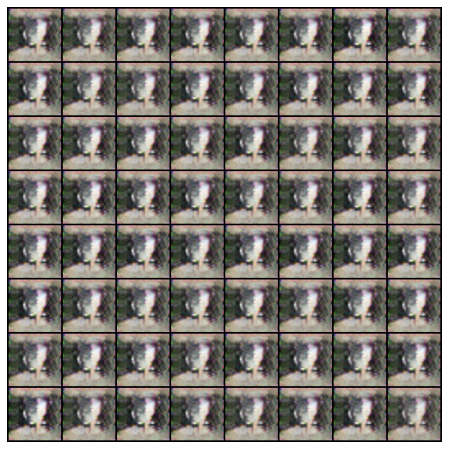

In [10]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())